# CNN with Experiment Tracking - different models, Dataset structure and hyperparameters

Machine learning and deep learning are very experimental.

You have to cook up lots of different models.

#The data
The data compares Shank3 (a subtype of autism), ASD (another type of autism), and the control (healthy) group based on the coordinates at which they activate.

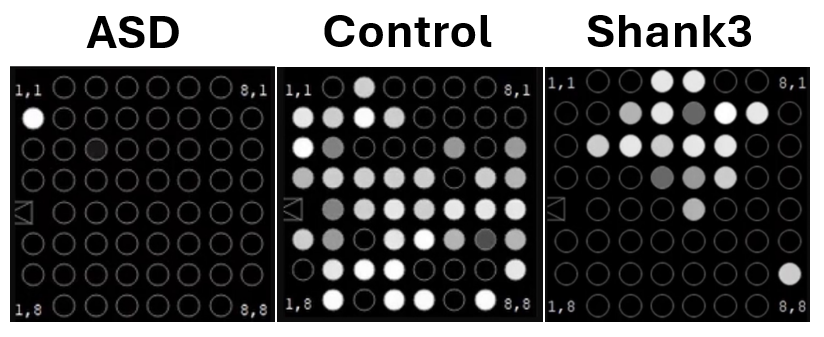

# What kind of experiments should you run?

1. Change number of <b>epochs</b>
2. Change number of <b>layers/hidden units</b>
3. Change amount of <b>data</b>
4. Change the <b>learning rate</b>
5. Different kind of <b>data augmentation</b>
6. Different <b>model architecture</b>

We'll start by creating two list and a dictionary:
1. List of the number of epochs ([5,10])
2. List of the models we'd like to test (["effnetb0","effnetb2")
3. Dictionary of different training DataLoaders

In [1]:
# Imports
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms
from pathlib import Path
import requests
import zipfile
import os
import zipfile
from pathlib import Path
import requests


In [2]:
# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the going_modular directory, download it from GitHub if it doesn't work
try:
    from going_modular.going_modular import data_setup, engine
except:
    # Get the modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    # Download going_modular.zip
    source = 'https://github.com/liatdavid2/Surface_Crack_Detection/raw/main/going_modular.zip'
    home_path = Path("/content")
    target_file = Path(source).name
    with open(home_path / target_file, "wb") as f:
        request = requests.get(source)
        print(f"[INFO] Downloading {target_file} from {source}...")
        f.write(request.content)

    # Unzip control,Shank3,ASD data
    with zipfile.ZipFile(home_path / target_file, "r") as zip_ref:
        print(f"[INFO] Unzipping {target_file} data...")
        zip_ref.extractall(home_path)

    # Remove .zip file
    #if remove_source:
    os.remove(home_path / target_file)
    from going_modular.going_modular import data_setup, engine

[INFO] Couldn't find torchinfo... installing it.
[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
[INFO] Downloading going_modular.zip from https://github.com/liatdavid2/Surface_Crack_Detection/raw/main/going_modular.zip...
[INFO] Unzipping going_modular.zip data...


In [3]:
# For GPU support
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [4]:
# Create a helper function to set seeds
# Set seeds
def set_seeds(seed: int=42):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    # Set the seed for CUDA torch operations (ones that happen on the GPU)
    torch.cuda.manual_seed(seed)

# preprocessing data

In [5]:
# download_data helper function

def download_data(source: str,
                  destination: str,
                  remove_source: bool = True) -> Path:
    """Downloads a zipped dataset from source and unzips to destination.

    Args:
        source (str): A link to a zipped file containing data.
        destination (str): A target directory to unzip data to.
        remove_source (bool): Whether to remove the source after downloading and extracting.

    Returns:
        pathlib.Path to downloaded data.
    """
    # Setup path to data folder
    data_path = Path("data/")
    image_path = data_path / destination

    # If the image folder doesn't exist, download it and prepare it...
    if image_path.is_dir():
        print(f"[INFO] {image_path} directory exists, skipping download.")
    else:
        print(f"[INFO] Did not find {image_path} directory, creating one...")
        image_path.mkdir(parents=True, exist_ok=True)

        # Download control,Shank3,ASD data
        target_file = Path(source).name
        with open(data_path / target_file, "wb") as f:
            request = requests.get(source)
            print(f"[INFO] Downloading {target_file} from {source}...")
            f.write(request.content)

        # Unzip control,Shank3,ASD data
        with zipfile.ZipFile(data_path / target_file, "r") as zip_ref:
            print(f"[INFO] Unzipping {target_file} data...")
            zip_ref.extractall(image_path)

        # Remove .zip file
        if remove_source:
            os.remove(data_path / target_file)

    return image_path

In [6]:
# Download 10 percent and 20 percent training data (if necessary)
data_10_percent_path = download_data(source="https://github.com/liatdavid2/my_custom_datasets/raw/main/coordinates_control_shank3_asd.zip",
                                     destination="coordinates_control_shank3_asd")

data_20_percent_path = download_data(source="https://github.com/liatdavid2/my_custom_datasets/raw/main/coordinates_control_shank3_asd.zip",
                                     destination="coordinates_control_shank3_asd")

[INFO] Did not find data/coordinates_control_shank3_asd directory, creating one...
[INFO] Downloading coordinates_control_shank3_asd.zip from https://github.com/liatdavid2/my_custom_datasets/raw/main/coordinates_control_shank3_asd.zip...
[INFO] Unzipping coordinates_control_shank3_asd.zip data...
[INFO] data/coordinates_control_shank3_asd directory exists, skipping download.


In [7]:
# Setup training directory paths
train_dir_10_percent = data_10_percent_path / "train"
train_dir_20_percent = data_20_percent_path / "train"

# Setup testing directory paths (note: use the same test dataset for both to compare the results)
val_dir = data_10_percent_path / "val"
test_dir = data_10_percent_path / "test"

# Check the directories
print(f"Training directory 10%: {train_dir_10_percent}")
print(f"Training directory 20%: {train_dir_20_percent}")
print(f"Val directory: {val_dir}")
print(f"Test directory: {test_dir}")

Training directory 10%: data/coordinates_control_shank3_asd/train
Training directory 20%: data/coordinates_control_shank3_asd/train
Val directory: data/coordinates_control_shank3_asd/val
Test directory: data/coordinates_control_shank3_asd/test


In [8]:
# 7.4 Transform Datasets and create DataLoaders
from torchvision import transforms

# Create a transform to normalize data distribution to be inline with ImageNet
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], # values per colour channel [red, green, blue]
                                 std=[0.229, 0.224, 0.225]) # values per colour channel [red, green, blue]

# Compose transforms into a pipeline
simple_transform = transforms.Compose([
    transforms.Resize((224, 224)), # 1. Resize the images
    transforms.ToTensor(), # 2. Turn the images into tensors with values between 0 & 1
    normalize # 3. Normalize the images so their distributions match the ImageNet dataset
])

In [9]:
BATCH_SIZE = 32

# Create 10% training and test DataLoaders
train_dataloader_10_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir_10_percent,
    test_dir=val_dir,
    transform=simple_transform,
    batch_size=BATCH_SIZE
)

# Create 20% training and test data DataLoders
train_dataloader_20_percent, test_dataloader, class_names = data_setup.create_dataloaders(train_dir=train_dir_20_percent,
    test_dir=val_dir,
    transform=simple_transform,
    batch_size=BATCH_SIZE
)

# Find the number of samples/batches per dataloader (using the same test_dataloader for both experiments)
print(f"Number of batches of size {BATCH_SIZE} in 10 percent training data: {len(train_dataloader_10_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in 20 percent training data: {len(train_dataloader_20_percent)}")
print(f"Number of batches of size {BATCH_SIZE} in testing data: {len(train_dataloader_10_percent)} (all experiments will use the same test set)")
print(f"Number of classes: {len(class_names)}, class names: {class_names}")

Number of batches of size 32 in 10 percent training data: 13
Number of batches of size 32 in 20 percent training data: 13
Number of batches of size 32 in testing data: 13 (all experiments will use the same test set)
Number of classes: 3, class names: ['ID1_Autism', 'Shank3', 'control2']


#  Train model and track results

In [10]:
from torch.utils.tensorboard import SummaryWriter

# Create a writer with all default settings
writer = SummaryWriter()

In [11]:
def create_writer(experiment_name: str,
                  model_name: str,
                  extra: str=None) -> torch.utils.tensorboard.writer.SummaryWriter():
    """Creates a torch.utils.tensorboard.writer.SummaryWriter() instance saving to a specific log_dir.

    log_dir is a combination of runs/timestamp/experiment_name/model_name/extra.

    Where timestamp is the current date in YYYY-MM-DD format.

    Args:
        experiment_name (str): Name of experiment.
        model_name (str): Name of model.
        extra (str, optional): Anything extra to add to the directory. Defaults to None.

    Returns:
        torch.utils.tensorboard.writer.SummaryWriter(): Instance of a writer saving to log_dir.

    Example usage:
        # Create a writer saving to "runs/2022-06-04/data_10_percent/effnetb2/5_epochs/"
        writer = create_writer(experiment_name="data_10_percent",
                               model_name="effnetb2",
                               extra="5_epochs")
        # The above is the same as:
        writer = SummaryWriter(log_dir="runs/2022-06-04/data_10_percent/effnetb2/5_epochs/")
    """
    from datetime import datetime
    import os

    # Get timestamp of current date (all experiments on certain day live in same folder)
    timestamp = datetime.now().strftime("%Y-%m-%d") # returns current date in YYYY-MM-DD format

    if extra:
        # Create log directory path
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name, extra)
    else:
        log_dir = os.path.join("runs", timestamp, experiment_name, model_name)

    print(f"[INFO] Created SummaryWriter, saving to: {log_dir}...")
    return SummaryWriter(log_dir=log_dir)

In [12]:
# Now we've got a create_writer() function, let's try it out.
# Create an example writer
example_writer = create_writer(experiment_name="data_10_percent",
                               model_name="effnetb0",
                               extra="5_epochs")

[INFO] Created SummaryWriter, saving to: runs/2024-04-22/data_10_percent/effnetb0/5_epochs...


In [13]:
from typing import Dict, List
from tqdm.auto import tqdm

# Add writer parameter to train()
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device,
          writer: torch.utils.tensorboard.writer.SummaryWriter # new parameter to take in a writer
          ) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Stores metrics to specified writer log_dir if present.

    Args:
      model: A PyTorch model to be trained and tested.
      train_dataloader: A DataLoader instance for the model to be trained on.
      test_dataloader: A DataLoader instance for the model to be tested on.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      loss_fn: A PyTorch loss function to calculate loss on both datasets.
      epochs: An integer indicating how many epochs to train for.
      device: A target device to compute on (e.g. "cuda" or "cpu").
      writer: A SummaryWriter() instance to log model results to.

    Returns:
      A dictionary of training and testing loss as well as training and
      testing accuracy metrics. Each metric has a value in a list for
      each epoch.
      In the form: {train_loss: [...],
                train_acc: [...],
                test_loss: [...],
                test_acc: [...]}
      For example if training for epochs=2:
              {train_loss: [2.0616, 1.0537],
                train_acc: [0.3945, 0.3945],
                test_loss: [1.2641, 1.5706],
                test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)


        ### New: Use the writer parameter to track experiments ###
        # See if there's a writer, if so, log to it
        if writer:
            # Add results to SummaryWriter
            writer.add_scalars(main_tag="Loss",
                               tag_scalar_dict={"train_loss": train_loss,
                                                "test_loss": test_loss},
                               global_step=epoch)
            writer.add_scalars(main_tag="Accuracy",
                               tag_scalar_dict={"train_acc": train_acc,
                                                "test_acc": test_acc},
                               global_step=epoch)

            # Close the writer
            writer.close()
        else:
            pass
    ### End new ###

    # Return the filled results at the end of the epochs
    return results

In [14]:
# 7.5 Create feature extractor models

import torchvision
from torchinfo import summary

from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torchvision.models._api import WeightsEnum
from torch.hub import load_state_dict_from_url

def get_state_dict(self, *args, **kwargs):
    kwargs.pop("check_hash")
    return load_state_dict_from_url(self.url, *args, **kwargs)
WeightsEnum.get_state_dict = get_state_dict

# 1. Create an instance of EffNetB2 with pretrained weights
effnetb2_weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT # "DEFAULT" means best available weights
effnetb2 = torchvision.models.efficientnet_b2(weights=effnetb2_weights)

# # 2. Get a summary of standard EffNetB2 from torchvision.models (uncomment for full output)
# summary(model=effnetb2,
#         input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
#         # col_names=["input_size"], # uncomment for smaller output
#         col_names=["input_size", "output_size", "num_params", "trainable"],
#         col_width=20,
#         row_settings=["var_names"]
# )

# 3. Get the number of in_features of the EfficientNetB2 classifier layer
print(f"Number of in_features to final layer of EfficientNetB2: {len(effnetb2.classifier.state_dict()['1.weight'][0])}")

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 194MB/s]


Number of in_features to final layer of EfficientNetB2: 1408


In [15]:
import torchvision
from torch import nn

# Get num out features (one for each class control,Shank3,ASD)
OUT_FEATURES = len(class_names)

# Create an EffNetB0 feature extractor
def create_effnetb0():
    # 1. Get the base mdoel with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
    model = torchvision.models.efficientnet_b0(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features=1280, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb0"
    print(f"[INFO] Created new {model.name} model.")
    return model

# Create an EffNetB2 feature extractor
def create_effnetb2():
    # 1. Get the base model with pretrained weights and send to target device
    weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT
    model = torchvision.models.efficientnet_b2(weights=weights).to(device)

    # 2. Freeze the base model layers
    for param in model.features.parameters():
        param.requires_grad = False

    # 3. Set the seeds
    set_seeds()

    # 4. Change the classifier head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.3),
        nn.Linear(in_features=1408, out_features=OUT_FEATURES)
    ).to(device)

    # 5. Give the model a name
    model.name = "effnetb2"
    print(f"[INFO] Created new {model.name} model.")
    return model

In [16]:
effnetb0 = create_effnetb0()

# Get an output summary of the layers in our EffNetB0 feature extractor model (uncomment to view full output)
# summary(model=effnetb0,
#         input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
#         # col_names=["input_size"], # uncomment for smaller output
#         col_names=["input_size", "output_size", "num_params", "trainable"],
#         col_width=20,
#         row_settings=["var_names"]
# )

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 153MB/s]


[INFO] Created new effnetb0 model.


In [17]:
effnetb2 = create_effnetb2()

# Get an output summary of the layers in our EffNetB2 feature extractor model (uncomment to view full output)
# summary(model=effnetb2,
#         input_size=(32, 3, 224, 224), # make sure this is "input_size", not "input_shape"
#         # col_names=["input_size"], # uncomment for smaller output
#         col_names=["input_size", "output_size", "num_params", "trainable"],
#         col_width=20,
#         row_settings=["var_names"]
# )

[INFO] Created new effnetb2 model.


In [18]:
# 1. Create epochs list
num_epochs = [5, 10]

# 2. Create models list (need to create a new model for each experiment)
models = ["effnetb0", "effnetb2"]

# 3. Create dataloaders dictionary for various dataloaders
train_dataloaders = {"data_10_percent": train_dataloader_10_percent,
                     "data_20_percent": train_dataloader_20_percent}

In [19]:
%%time
from going_modular.going_modular.utils import save_model
from going_modular.going_modular.engine import train_step, test_step
# 1. Set the random seeds
set_seeds(seed=42)

# 2. Keep track of experiment numbers
experiment_number = 0

# 3. Loop through each DataLoader
for dataloader_name, train_dataloader in train_dataloaders.items():

    # 4. Loop through each number of epochs
    for epochs in num_epochs:

        # 5. Loop through each model name and create a new model based on the name
        for model_name in models:

            # 6. Create information print outs
            experiment_number += 1
            print(f"[INFO] Experiment number: {experiment_number}")
            print(f"[INFO] Model: {model_name}")
            print(f"[INFO] DataLoader: {dataloader_name}")
            print(f"[INFO] Number of epochs: {epochs}")

            # 7. Select the model
            if model_name == "effnetb0":
                model = create_effnetb0() # creates a new model each time (important because we want each experiment to start from scratch)
            else:
                model = create_effnetb2() # creates a new model each time (important because we want each experiment to start from scratch)

            # 8. Create a new loss and optimizer for every model
            loss_fn = nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(params=model.parameters(), lr=0.001)

            # 9. Train target model with target dataloaders and track experiments
            train(model=model,
                  train_dataloader=train_dataloader,
                  test_dataloader=test_dataloader,
                  optimizer=optimizer,
                  loss_fn=loss_fn,
                  epochs=epochs,
                  device=device,
                  writer=create_writer(experiment_name=dataloader_name,
                                       model_name=model_name,
                                       extra=f"{epochs}_epochs"))

            # 10. Save the model to file so we can get back the best model
            save_filepath = f"07_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
            save_model(model=model,
                       target_dir="models",
                       model_name=save_filepath)
            print("-"*50 + "\n")

[INFO] Experiment number: 1
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2024-04-22/data_10_percent/effnetb0/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 0.7204 | train_acc: 0.7981 | test_loss: 0.9550 | test_acc: 0.3021
Epoch: 2 | train_loss: 0.2468 | train_acc: 0.9928 | test_loss: 0.8471 | test_acc: 0.5208
Epoch: 3 | train_loss: 0.1230 | train_acc: 0.9904 | test_loss: 0.4971 | test_acc: 0.8750
Epoch: 4 | train_loss: 0.0715 | train_acc: 0.9928 | test_loss: 0.1590 | test_acc: 1.0000
Epoch: 5 | train_loss: 0.1130 | train_acc: 0.9696 | test_loss: 0.0355 | test_acc: 1.0000
[INFO] Saving model to: models/07_effnetb0_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 2
[INFO] Model: effnetb2
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2024-04-22/data_10_percent/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7789 | train_acc: 0.7163 | test_loss: 1.0162 | test_acc: 0.4062
Epoch: 2 | train_loss: 0.2972 | train_acc: 0.9976 | test_loss: 0.7754 | test_acc: 0.9375
Epoch: 3 | train_loss: 0.1726 | train_acc: 0.9880 | test_loss: 0.3537 | test_acc: 0.9688
Epoch: 4 | train_loss: 0.2212 | train_acc: 0.9207 | test_loss: 0.1255 | test_acc: 1.0000
Epoch: 5 | train_loss: 0.0736 | train_acc: 0.9976 | test_loss: 0.0620 | test_acc: 1.0000
[INFO] Saving model to: models/07_effnetb2_data_10_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 3
[INFO] Model: effnetb0
[INFO] DataLoader: data_10_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2024-04-22/data_10_percent/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7204 | train_acc: 0.7981 | test_loss: 0.9550 | test_acc: 0.3021
Epoch: 2 | train_loss: 0.2468 | train_acc: 0.9928 | test_loss: 0.8471 | test_acc: 0.5208
Epoch: 3 | train_loss: 0.1230 | train_acc: 0.9904 | test_loss: 0.4971 | test_acc: 0.8750
Epoch: 4 | train_loss: 0.0715 | train_acc: 0.9928 | test_loss: 0.1590 | test_acc: 1.0000
Epoch: 5 | train_loss: 0.1130 | train_acc: 0.9696 | test_loss: 0.0355 | test_acc: 1.0000
Epoch: 6 | train_loss: 0.1052 | train_acc: 0.9832 | test_loss: 0.0211 | test_acc: 1.0000
Epoch: 7 | train_loss: 0.0862 | train_acc: 0.9880 | test_loss: 0.0116 | test_acc: 1.0000
Epoch: 8 | train_loss: 0.0444 | train_acc: 1.0000 | test_loss: 0.0102 | test_acc: 1.0000
Epoch: 9 | train_loss: 0.0572 | train_acc: 0.9976 | test_loss: 0.0090 | test_acc: 1.0000
Epoch: 10 | train_loss: 0.1851 | train_acc: 0.9231 | test_loss: 0.0100 | test_acc: 1.0000
[INFO] Saving model to: models/07_effnetb0_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7789 | train_acc: 0.7163 | test_loss: 1.0162 | test_acc: 0.4062
Epoch: 2 | train_loss: 0.2972 | train_acc: 0.9976 | test_loss: 0.7754 | test_acc: 0.9375
Epoch: 3 | train_loss: 0.1726 | train_acc: 0.9880 | test_loss: 0.3537 | test_acc: 0.9688
Epoch: 4 | train_loss: 0.2212 | train_acc: 0.9207 | test_loss: 0.1255 | test_acc: 1.0000
Epoch: 5 | train_loss: 0.0736 | train_acc: 0.9976 | test_loss: 0.0620 | test_acc: 1.0000
Epoch: 6 | train_loss: 0.1553 | train_acc: 0.9671 | test_loss: 0.0434 | test_acc: 1.0000
Epoch: 7 | train_loss: 0.0892 | train_acc: 0.9976 | test_loss: 0.0391 | test_acc: 1.0000
Epoch: 8 | train_loss: 0.1948 | train_acc: 0.9183 | test_loss: 0.0321 | test_acc: 1.0000
Epoch: 9 | train_loss: 0.1425 | train_acc: 0.9671 | test_loss: 0.0305 | test_acc: 1.0000
Epoch: 10 | train_loss: 0.0592 | train_acc: 0.9976 | test_loss: 0.0257 | test_acc: 1.0000
[INFO] Saving model to: models/07_effnetb2_data_10_percent_10_epochs.pth
------------------------------------

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7204 | train_acc: 0.7981 | test_loss: 0.9550 | test_acc: 0.3021
Epoch: 2 | train_loss: 0.2468 | train_acc: 0.9928 | test_loss: 0.8471 | test_acc: 0.5208
Epoch: 3 | train_loss: 0.1230 | train_acc: 0.9904 | test_loss: 0.4971 | test_acc: 0.8750
Epoch: 4 | train_loss: 0.0715 | train_acc: 0.9928 | test_loss: 0.1590 | test_acc: 1.0000
Epoch: 5 | train_loss: 0.1130 | train_acc: 0.9696 | test_loss: 0.0355 | test_acc: 1.0000
[INFO] Saving model to: models/07_effnetb0_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 6
[INFO] Model: effnetb2
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 5
[INFO] Created new effnetb2 model.
[INFO] Created SummaryWriter, saving to: runs/2024-04-22/data_20_percent/effnetb2/5_epochs...


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7789 | train_acc: 0.7163 | test_loss: 1.0162 | test_acc: 0.4062
Epoch: 2 | train_loss: 0.2972 | train_acc: 0.9976 | test_loss: 0.7754 | test_acc: 0.9375
Epoch: 3 | train_loss: 0.1726 | train_acc: 0.9880 | test_loss: 0.3537 | test_acc: 0.9688
Epoch: 4 | train_loss: 0.2212 | train_acc: 0.9207 | test_loss: 0.1255 | test_acc: 1.0000
Epoch: 5 | train_loss: 0.0736 | train_acc: 0.9976 | test_loss: 0.0620 | test_acc: 1.0000
[INFO] Saving model to: models/07_effnetb2_data_20_percent_5_epochs.pth
--------------------------------------------------

[INFO] Experiment number: 7
[INFO] Model: effnetb0
[INFO] DataLoader: data_20_percent
[INFO] Number of epochs: 10
[INFO] Created new effnetb0 model.
[INFO] Created SummaryWriter, saving to: runs/2024-04-22/data_20_percent/effnetb0/10_epochs...


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7204 | train_acc: 0.7981 | test_loss: 0.9550 | test_acc: 0.3021
Epoch: 2 | train_loss: 0.2468 | train_acc: 0.9928 | test_loss: 0.8471 | test_acc: 0.5208
Epoch: 3 | train_loss: 0.1230 | train_acc: 0.9904 | test_loss: 0.4971 | test_acc: 0.8750
Epoch: 4 | train_loss: 0.0715 | train_acc: 0.9928 | test_loss: 0.1590 | test_acc: 1.0000
Epoch: 5 | train_loss: 0.1130 | train_acc: 0.9696 | test_loss: 0.0355 | test_acc: 1.0000
Epoch: 6 | train_loss: 0.1052 | train_acc: 0.9832 | test_loss: 0.0211 | test_acc: 1.0000
Epoch: 7 | train_loss: 0.0862 | train_acc: 0.9880 | test_loss: 0.0116 | test_acc: 1.0000
Epoch: 8 | train_loss: 0.0444 | train_acc: 1.0000 | test_loss: 0.0102 | test_acc: 1.0000
Epoch: 9 | train_loss: 0.0572 | train_acc: 0.9976 | test_loss: 0.0090 | test_acc: 1.0000
Epoch: 10 | train_loss: 0.1851 | train_acc: 0.9231 | test_loss: 0.0100 | test_acc: 1.0000
[INFO] Saving model to: models/07_effnetb0_data_20_percent_10_epochs.pth
------------------------------------

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7789 | train_acc: 0.7163 | test_loss: 1.0162 | test_acc: 0.4062
Epoch: 2 | train_loss: 0.2972 | train_acc: 0.9976 | test_loss: 0.7754 | test_acc: 0.9375
Epoch: 3 | train_loss: 0.1726 | train_acc: 0.9880 | test_loss: 0.3537 | test_acc: 0.9688
Epoch: 4 | train_loss: 0.2212 | train_acc: 0.9207 | test_loss: 0.1255 | test_acc: 1.0000
Epoch: 5 | train_loss: 0.0736 | train_acc: 0.9976 | test_loss: 0.0620 | test_acc: 1.0000
Epoch: 6 | train_loss: 0.1553 | train_acc: 0.9671 | test_loss: 0.0434 | test_acc: 1.0000
Epoch: 7 | train_loss: 0.0892 | train_acc: 0.9976 | test_loss: 0.0391 | test_acc: 1.0000
Epoch: 8 | train_loss: 0.1948 | train_acc: 0.9183 | test_loss: 0.0321 | test_acc: 1.0000
Epoch: 9 | train_loss: 0.1425 | train_acc: 0.9671 | test_loss: 0.0305 | test_acc: 1.0000
Epoch: 10 | train_loss: 0.0592 | train_acc: 0.9976 | test_loss: 0.0257 | test_acc: 1.0000
[INFO] Saving model to: models/07_effnetb2_data_20_percent_10_epochs.pth
------------------------------------

# View our models results in TensorBoard

In [20]:
#8.View experiments in TensorBoard

# Viewing TensorBoard in Jupyter and Google Colab Notebooks (uncomment to view full TensorBoard instance)
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [21]:
# you can see that the EffNetB0 model trained for 10 epochs and with 20% of the
# data achieves the lowest loss. This sticks with the overall trend of the experiments that:
# more data, larger model and longer training time is generally better.


 # Upload the results to TensorBoard.dev (uncomment to try it out)
!tensorboard dev upload --logdir runs \
     --name "07. PyTorch Experiment Tracking: FoodVision Mini model results" \
     --description "Comparing results of different model size, training data amount and training time."

2024-04-22 07:33:05.793188: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-22 07:33:05.793236: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-22 07:33:05.794386: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-22 07:33:06.931667: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
****************************************************************
****************************************************************
****************************************************************

Uploading TensorBoard logs to https://tensorb

# Load in the best model and make predictions with it

In [22]:
# Setup the best model filepath
best_model_path = "models/07_effnetb2_data_10_percent_10_epochs.pth"

# Instantiate a new instance of EffNetB2 (to load the saved state_dict() to)
best_model = create_effnetb2()
#best_model = create_effnetb0()

# Load the saved best model state_dict()
best_model.load_state_dict(torch.load(best_model_path))

[INFO] Created new effnetb2 model.


<All keys matched successfully>

In [23]:
# Best model loaded!
#While we're here, let's check its filesize.
#This is an important consideration later on when deploying the model (incorporating it in an app).
# If the model is too large, it can be hard to deploy.

# Check the model file size
from pathlib import Path

# Get the model size in bytes then convert to megabytes
effnetb2_model_size = Path(best_model_path).stat().st_size // (1024*1024)
print(f"EfficientNetB2 feature extractor model size: {effnetb2_model_size} MB")

EfficientNetB2 feature extractor model size: 29 MB


In [24]:
import re
from typing import List, Tuple

from PIL import Image

# 1. Take in a trained model, class names, image path, image size, a transform and target device
def pred_and_plot_image(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: torchvision.transforms = None,
                        device: torch.device=device):


    # 2. Open image
    img = Image.open(image_path).convert('RGB')
    #print('img:',img)
    # 3. Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    ### Predict on image ###

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
      # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
      transformed_image = image_transform(img).unsqueeze(dim=0)

      # 7. Make a prediction on image with an extra dimension and send it to the target device
      target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    # 10. Plot image with predicted label and probability
    plt.figure()
    plt.imshow(img)
    #print(target_image_pred_label,)
    plt.title(f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f} | real: {image_path}")
    plt.axis(False);
    real_label = str(image_path).split("/")[-1]
    real_label = re.sub(r'(\d+)', '/', real_label).split("/")[0]
    return class_names[target_image_pred_label], real_label

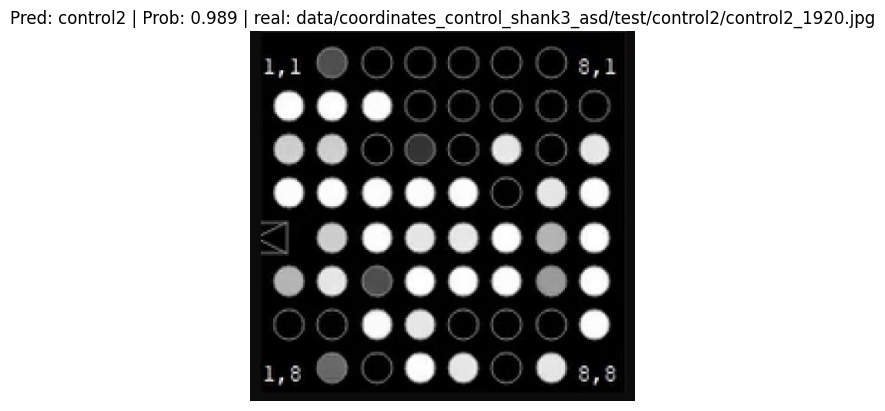

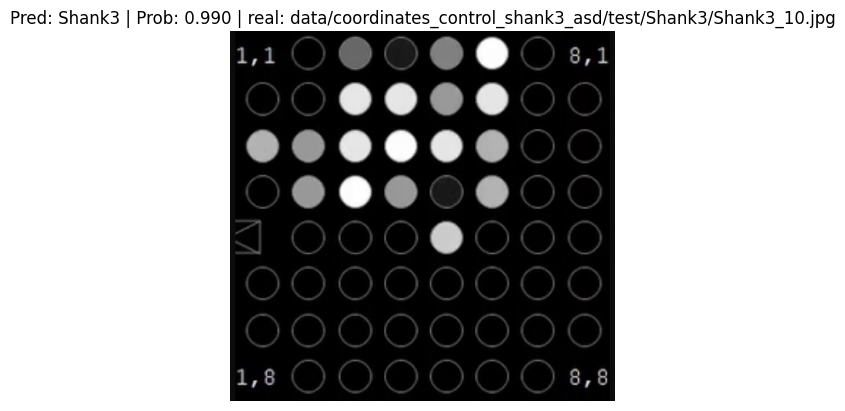

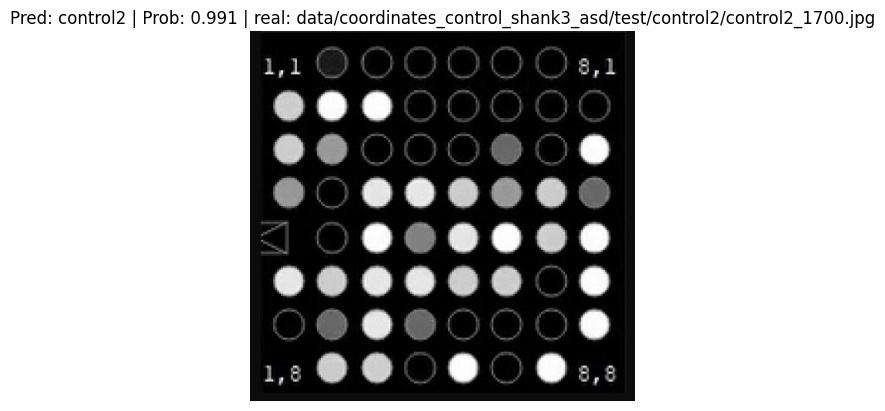

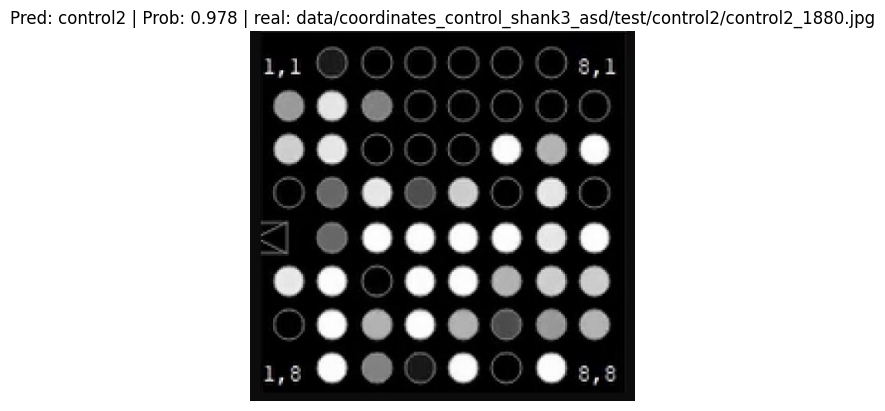

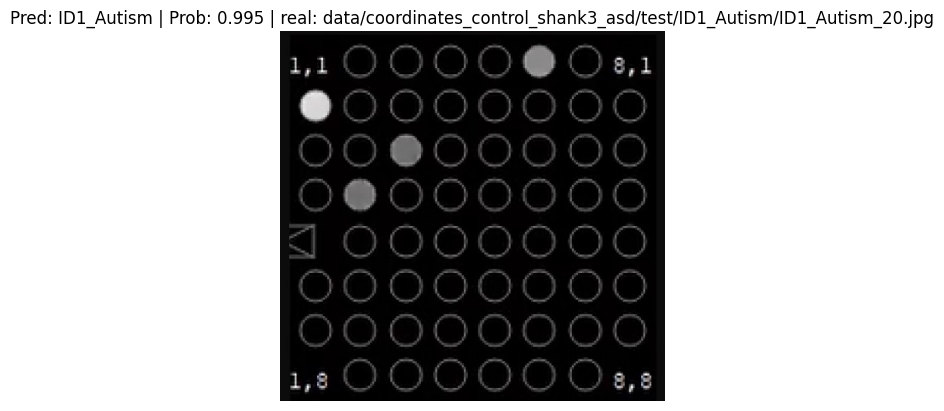

...

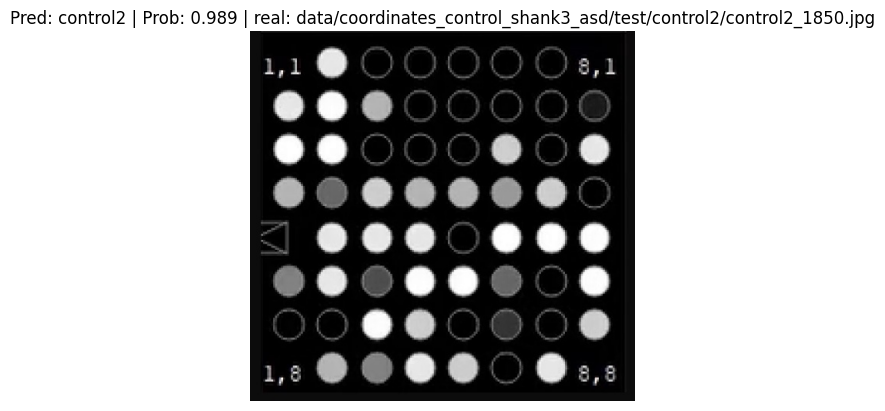

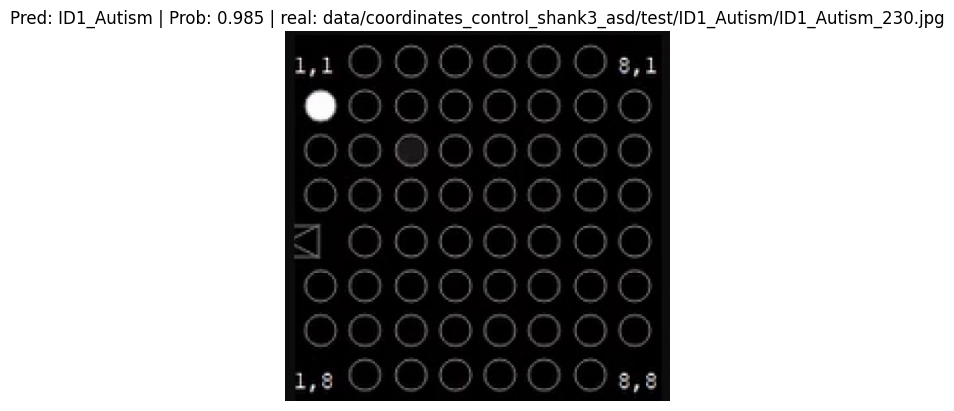

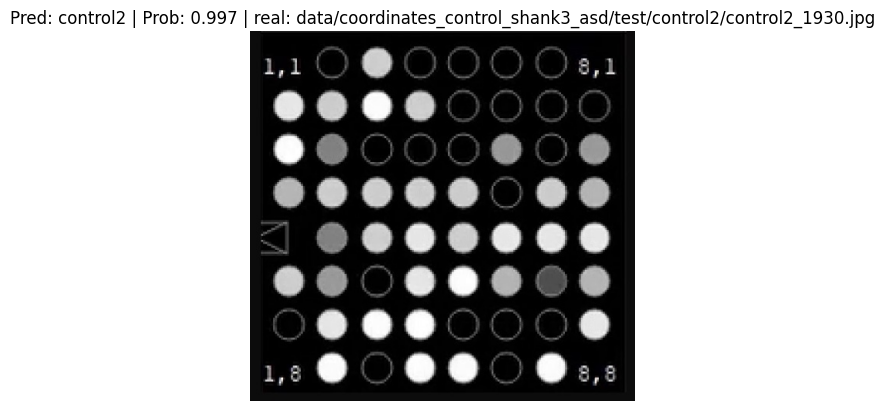

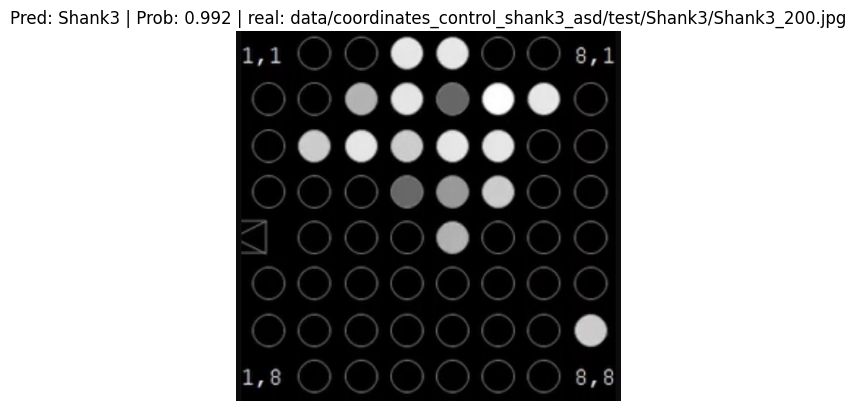

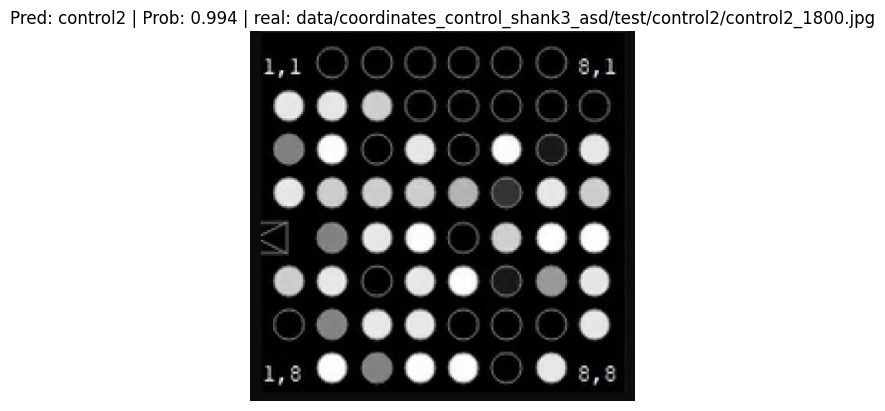

In [25]:
# Import function to make predictions on images and plot them

# Get a random list of 3 images from 20% test set
import random
num_images_to_plot = 15
test_image_path_list = list(Path(data_20_percent_path / "test").glob("*/*.jpg")) # get all test image paths from 20% dataset
test_image_path_sample = random.sample(population=test_image_path_list,
                                       k=num_images_to_plot) # randomly select k number of images

# Iterate through random test image paths, make predictions on them and plot them
for image_path in test_image_path_sample:
    pred_and_plot_image(model=best_model,
                        image_path=image_path,
                        class_names=class_names,
                        image_size=(224, 224))

In [26]:
import re
from typing import List, Tuple

from PIL import Image

# 1. Take in a trained model, class names, image path, image size, a transform and target device
def pred_image(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str],
                        image_size: Tuple[int, int] = (224, 224),
                        transform: torchvision.transforms = None,
                        device: torch.device=device):


    # 2. Open image
    img = Image.open(image_path).convert('RGB')
    #print('img:',img)
    # 3. Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225]),
        ])

    ### Predict on image ###

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
      # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
      transformed_image = image_transform(img).unsqueeze(dim=0)

      # 7. Make a prediction on image with an extra dimension and send it to the target device
      target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    real_label = str(image_path).split("/")[-2]
    #real_label = re.sub(r'(\d+)', '/', real_label).split("/")[0]
    return class_names[target_image_pred_label], real_label

In [27]:
# Check test set
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,confusion_matrix


#test_image_path_list = list(Path(test_dir).glob("*/*.JPG")) # get list all image paths from test data
test_image_path_list = list(Path(test_dir).glob("*/*.jpg")) # get list all image paths from test data
print(len(test_image_path_list))
y_true = []
y_pred = []
# Make predictions on and plot the images
for image_path in test_image_path_list:
    #print(image_path)
    """pred_and_plot_image(model=best_model,
              image_path=image_path,
              class_names=class_names,
              # transform=weights.transforms(), # optionally pass in a specified transform from our pretrained model weights
              image_size=(224, 224))"""
    pred,real = pred_image(model=best_model,
                        image_path=image_path,
                        class_names=class_names,
                        # transform=weights.transforms(), # optionally pass in a specified transform from our pretrained model weights
                        image_size=(224, 224))
    print(pred,real)
    #print(pred,real)
    for i in range(len(class_names)):
      if real == class_names[i]:
          y_true.append(i)
    for i in range(len(class_names)):
      if pred == class_names[i]:
          y_pred.append(i)

print(confusion_matrix(y_true, y_pred))
print(accuracy_score(y_true, y_pred))
print(recall_score(y_true, y_pred, average='macro'))

# Evaluate the model on test data
print("Evaluate the model on test data")
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')
print('\n'+model_name+' classifier:')
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
cm = confusion_matrix(y_true,y_pred)
print("confusion matrix:\n",cm)


72
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
Shank3 Shank3
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
control2 control2
ID1_Autism ID1_Autism
ID1_Autism ID1_Autism
ID1_Autism ID1_Autism
ID1_Autism ID1_Autism
ID1_Autism ID1_Autism
ID1_Autism ID1_Autism
ID1_Autism ID1_Autism
ID1_Autism ID1_Autism
ID1_Autism ID1_Autism
ID1_Autism ID1_Autism
ID1_Autis

data/Shank3_220.jpg
['ID1_Autism', 'Shank3', 'control2']
data/ID1_Autism_100.jpg
['ID1_Autism', 'Shank3', 'control2']


('ID1_Autism', 'ID')

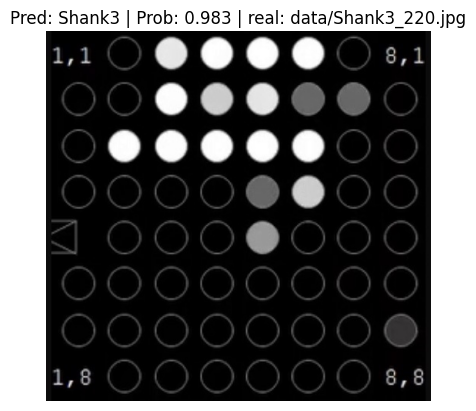

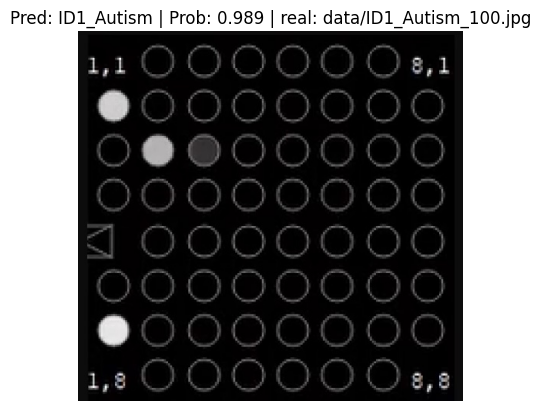

In [28]:
# 6.1 Making predictions on a custom image
#It looks like our model does well qualitatively on data from the test set.
#But how about on our own custom image?
#That's where the real fun of machine learning is!
#Predicting on your own custom data, outisde of any training or test set.

# Download custom image
import requests

image_url = "https://github.com/liatdavid2/my_custom_datasets/raw/main/Shank3_220.jpg"
image_name = image_url.split('/')[-1]
# Setup custom image path
data_path = Path("data/")
custom_image_path = data_path / image_name
print(custom_image_path)

# Download the image if it doesn't already exist
if not custom_image_path.is_file():
    with open(custom_image_path, "wb") as f:
        # When downloading from GitHub, need to use the "raw" file link
        request = requests.get(image_url)
        print(f"Downloading {custom_image_path}...")
        f.write(request.content)
else:
    print(f"{custom_image_path} already exists, skipping download.")
print(class_names)
# Predict on custom image
pred_and_plot_image(model=model,
                    image_path=custom_image_path,
                    class_names=class_names)

# 6.1 Making predictions on a custom imageןר
#It looks like our model does well qualitatively on data from the test set.
#But how about on our own custom image?
#That's where the real fun of machine learning is!
#Predicting on your own custom data, outisde of any training or test set.

# Download custom image
import requests
image_url = "https://github.com/liatdavid2/my_custom_datasets/raw/main/ID1_Autism_100.jpg"
image_name = image_url.split('/')[-1]
# Setup custom image path
custom_image_path = data_path / image_name
print(custom_image_path)

# Download the image if it doesn't already exist
if not custom_image_path.is_file():
    with open(custom_image_path, "wb") as f:
        # When downloading from GitHub, need to use the "raw" file link
        request = requests.get(image_url)
        print(f"Downloading {custom_image_path}...")
        f.write(request.content)
else:
    print(f"{custom_image_path} already exists, skipping download.")
print(class_names)
# Predict on custom image
pred_and_plot_image(model=best_model,
                    image_path=custom_image_path,
                    class_names=class_names)